# Databricks ML End-To-End: From Data Ingest, Over Model Creation, To Serving

## Objective: Forecasting the average sales for each month in the upcoming year using AutoML model

Dataset: Retail dataset of a global superstore for 4 years, https://www.kaggle.com/datasets/jr2ngb/superstore-data

# Load Dataset from Catalog


In [0]:
# Read into Spark

salesDF = spark.table("superstore_forecast")
display(salesDF)

Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,Country,Postal Code,Market,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
42433,AG-2011-2040,1/1/2011,6/1/2011,Standard Class,TB-11280,Toby Braunhardt,Consumer,Constantine,Constantine,Algeria,null,Africa,Africa,OFF-TEN-10000025,Office Supplies,Storage,"Tenex Lockers, Blue",408.3,2,0.0,106.14,35.46,Medium
22253,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,Australia,null,APAC,Oceania,OFF-SU-10000618,Office Supplies,Supplies,"Acme Trimmer, High Speed",120.366,3,0.1,36.036,9.72,Medium
48883,HU-2011-1220,1/1/2011,5/1/2011,Second Class,AT-735,Annie Thurman,Consumer,Budapest,Budapest,Hungary,null,EMEA,EMEA,OFF-TEN-10001585,Office Supplies,Storage,"Tenex Box, Single Width",66.12,4,0.0,29.64,8.17,High
11731,IT-2011-3647632,1/1/2011,5/1/2011,Second Class,EM-14140,Eugene Moren,Home Office,Stockholm,Stockholm,Sweden,null,EU,North,OFF-PA-10001492,Office Supplies,Paper,"Enermax Note Cards, Premium",44.865,3,0.5,-26.055,4.82,High
22255,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,Australia,null,APAC,Oceania,FUR-FU-10003447,Furniture,Furnishings,"Eldon Light Bulb, Duo Pack",113.67,5,0.1,37.77,4.7,Medium
22254,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,Australia,null,APAC,Oceania,OFF-PA-10001968,Office Supplies,Paper,"Eaton Computer Printout Paper, 8.5 x 11",55.242,2,0.1,15.342,1.8,Medium
21613,IN-2011-30733,1/2/2011,3/2/2011,Second Class,PO-18865,Patrick O'Donnell,Consumer,Dhaka,Dhaka,Bangladesh,null,APAC,Central Asia,TEC-CO-10002316,Technology,Copiers,"Brother Personal Copier, Laser",285.78,2,0.0,71.4,57.3,Critical
34662,CA-2011-115161,1/2/2011,3/2/2011,First Class,LC-17050,Liz Carlisle,Consumer,Mission Viejo,California,United States,92691,US,West,FUR-BO-10003966,Furniture,Bookcases,"Sauder Facets Collection Library, Sky Alder Finish",290.666,2,0.15,3.4196,54.64,High
44508,AO-2011-1390,1/2/2011,4/2/2011,Second Class,DK-3150,David Kendrick,Corporate,Luanda,Luanda,Angola,null,Africa,Africa,OFF-FEL-10001541,Office Supplies,Storage,"Fellowes Lockers, Wire Frame",206.4,1,0.0,92.88,53.08,Critical
23688,ID-2011-56493,1/2/2011,3/2/2011,Second Class,SP-20650,Stephanie Phelps,Corporate,Yingcheng,Hubei,China,null,APAC,North Asia,OFF-ST-10002161,Office Supplies,Storage,"Tenex Trays, Single Width",162.72,3,0.0,68.31,44.36,Critical


In [0]:
# Display schema to see data types
salesDF.printSchema()

# Main features are Order Date and Sales, but Order Date is in string data type 

root
 |-- Row ID: long (nullable = true)
 |-- Order ID: string (nullable = true)
 |-- Order Date: string (nullable = true)
 |-- Ship Date: string (nullable = true)
 |-- Ship Mode: string (nullable = true)
 |-- Customer ID: string (nullable = true)
 |-- Customer Name: string (nullable = true)
 |-- Segment: string (nullable = true)
 |-- City: string (nullable = true)
 |-- State: string (nullable = true)
 |-- Country: string (nullable = true)
 |-- Postal Code: long (nullable = true)
 |-- Market: string (nullable = true)
 |-- Region: string (nullable = true)
 |-- Product ID: string (nullable = true)
 |-- Category: string (nullable = true)
 |-- Sub-Category: string (nullable = true)
 |-- Product Name: string (nullable = true)
 |-- Sales: double (nullable = true)
 |-- Quantity: long (nullable = true)
 |-- Discount: double (nullable = true)
 |-- Profit: double (nullable = true)
 |-- Shipping Cost: double (nullable = true)
 |-- Order Priority: string (nullable = true)



In [0]:
# Display summary statistics
display(salesDF.describe())

summary,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,Country,Postal Code,Market,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
count,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,9994,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290
mean,25645.5,null,null,null,null,null,null,null,null,null,null,55190.3794276566,null,null,null,null,null,null,246.49058120257232,3.4765451355039967,0.14290754533047115,28.610982477675975,26.375915188145807,null
stddev,14806.291990231697,null,null,null,null,null,null,null,null,null,null,32063.693350364483,null,null,null,null,null,null,487.56536053856394,2.2787663138033745,0.2122799316858657,174.34097190003288,57.296803894069775,null
min,1,AE-2011-9160,1/1/2011,1/1/2012,First Class,AA-10315,Aaron Bergman,Consumer,Aachen,'Ajman,Afghanistan,1040,APAC,Africa,FUR-ADV-10000002,Furniture,Accessories,"""While you Were Out"" Message Book, One Form per Page",0.444,1,0.0,-6599.978,0.0,Critical
max,51290,ZI-2014-9650,9/9/2014,9/9/2014,Standard Class,ZD-21925,Zuschuss Donatelli,Home Office,�guas Lindas de Goi�s,�ilina,Zimbabwe,99301,US,West,TEC-STA-10004927,Technology,Tables,netTALK DUO VoIP Telephone Service,22638.48,14,0.85,8399.976,933.57,Medium


In [0]:
def get_dataframe_shape(df):
    # Get the number of rows
    row_count = df.count()

    # Get the number of columns
    column_count = len(df.columns)

    # Print the number of rows and columns
    print(f"Number of rows: {row_count}")
    print(f"Number of columns: {column_count}")

get_dataframe_shape(salesDF)

Number of rows: 51290
Number of columns: 24


# Data Preprocessing

In [0]:
def remove_duplicates(df):
    # Count the number of duplicates
    duplicate_count = df.count() - df.dropDuplicates().count()
    print(f"Number of duplicates: {duplicate_count}")

    # Remove duplicates
    df = df.dropDuplicates()

    return df

# Display the DataFrame after removing duplicates
salesDF = remove_duplicates(salesDF)
display(salesDF)

Number of duplicates: 0


Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,Country,Postal Code,Market,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
15978,IT-2011-3468929,1/4/2011,4/4/2011,First Class,AS-10045,Aaron Smayling,Corporate,Rome,Lazio,Italy,null,EU,South,TEC-PH-10003963,Technology,Phones,"Apple Signal Booster, Full Size",496.584,6,0.4,-289.836,122.65,High
596,US-2011-132899,1/4/2011,5/4/2011,Second Class,JB-15400,Jennifer Braxton,Corporate,Lima,Lima (city),Peru,null,LATAM,South,FUR-CH-10004783,Furniture,Chairs,"Novimex Chairmat, Red",67.608,3,0.4,-29.352,5.65,Medium
41694,TU-2011-2420,1/8/2011,6/8/2011,Standard Class,DH-3075,Dave Hallsten,Corporate,Istanbul,Istanbul,Turkey,null,EMEA,EMEA,TEC-ENE-10000895,Technology,Accessories,"Enermax Mouse, Bluetooth",16.116,1,0.6,-19.344,0.97,High
27370,IN-2011-25070,1/9/2011,6/9/2011,Standard Class,MN-17935,Michael Nguyen,Consumer,Hefei,Anhui,China,null,APAC,North Asia,FUR-CH-10000974,Furniture,Chairs,"Harbour Creations Executive Leather Armchair, Black",473.61,1,0.0,142.08,42.96,High
8047,MX-2011-145380,1/9/2011,6/9/2011,Standard Class,GP-14740,Guy Phonely,Corporate,Le�n,Le�n,Nicaragua,null,LATAM,Central,OFF-SU-10002962,Office Supplies,Supplies,"Acme Scissors, Serrated",44.28,3,0.0,0.42,4.64,High
50859,GH-2011-8290,2/8/2011,6/8/2011,Standard Class,CC-2670,Craig Carreira,Consumer,Accra,Greater Accra,Ghana,null,Africa,Africa,OFF-STA-10001636,Office Supplies,Art,"Stanley Markers, Water Color",101.52,4,0.0,33.48,15.19,High
30451,ID-2011-80230,3/1/2011,9/1/2011,Standard Class,KL-16645,Ken Lonsdale,Consumer,Papakura,Auckland,New Zealand,null,APAC,Oceania,FUR-CH-10000214,Furniture,Chairs,"Hon Rocking Chair, Set of Two",159.444,2,0.4,-95.676,10.07,Low
29719,IN-2011-51740,3/8/2011,6/8/2011,Second Class,DM-13525,Don Miller,Corporate,Muzaffarpur,Bihar,India,null,APAC,Central Asia,OFF-FA-10003819,Office Supplies,Fasteners,"Advantus Paper Clips, Assorted Sizes",41.85,3,0.0,14.22,8.74,Critical
28048,ID-2011-72306,3/12/2011,7/12/2011,Standard Class,HG-14845,Harry Greene,Consumer,Ho Chi Minh City,Ho Ch� Minh City,Vietnam,null,APAC,Southeast Asia,OFF-ST-10003121,Office Supplies,Storage,"Rogers Box, Industrial",40.587,2,0.17,-1.473,7.56,High
6053,US-2011-108721,5/6/2011,10/6/2011,Standard Class,KB-16315,Karl Braun,Consumer,San Miguelito,Panama,Panama,null,LATAM,Central,FUR-BO-10000891,Furniture,Bookcases,"Ikea Classic Bookcase, Pine",991.44,6,0.4,-297.48,63.52,Medium


In [0]:
def remove_unnecessary_columns(df, columns_to_keep):
    # Select only the necessary columns
    df = df.select(columns_to_keep)
    
    return df

# Display the DataFrame after removing unnecessary columns
columns_to_keep = ['Order Date', 'Sales']
salesDF = remove_unnecessary_columns(salesDF, columns_to_keep)
display(salesDF)

Order Date,Sales
1/4/2011,496.584
1/4/2011,67.608
1/8/2011,16.116
1/9/2011,473.61
1/9/2011,44.28
2/8/2011,101.52
3/1/2011,159.444
3/8/2011,41.85
3/12/2011,40.587
5/6/2011,991.44


In [0]:
from pyspark.sql.functions import col, sum
from pyspark.sql import functions as F

def check_null_values(df):
    # Check for null values in the DataFrame
    null_values = df.select(
        [F.sum(F.col(c).isNull().cast("int")).alias(c) for c in df.columns]
    )
    
    return null_values

# Display the columns with null values (if any) and their respective counts
null_values = check_null_values(salesDF)
display(null_values)

Order Date,Sales
0,0


In [0]:
# Rename columns to avoid errors

def rename_column(df, old_name, new_name):
    # Rename the column
    df = df.withColumnRenamed(old_name, new_name)
    return df

# Display the data frame after renaming the column
salesDF = rename_column(salesDF, 'Order Date', 'Order_Date')
display(salesDF)

Order_Date,Sales
1/4/2011,496.584
1/4/2011,67.608
1/8/2011,16.116
1/9/2011,473.61
1/9/2011,44.28
2/8/2011,101.52
3/1/2011,159.444
3/8/2011,41.85
3/12/2011,40.587
5/6/2011,991.44


In [0]:
from pyspark.sql.functions import coalesce, to_date

def transform_date_column(df, column_name, new_column_name):
    # Set the timeParserPolicy to LEGACY
    spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")
    
    # Transform the date column with multiple formats
    df = df.withColumn(
        new_column_name,
        coalesce(
            to_date(df[column_name], 'dd/MM/yyyy'),
            to_date(df[column_name], 'dd-MM-yyyy')
        )
    )
    return df

# Display the data frame after transforming the data types
salesDF = transform_date_column(salesDF, 'Order_Date', 'Order_Date')
display(salesDF)

Order_Date,Sales
2011-04-01,496.584
2011-04-01,67.608
2011-08-01,16.116
2011-09-01,473.61
2011-09-01,44.28
2011-08-02,101.52
2011-01-03,159.444
2011-08-03,41.85
2011-12-03,40.587
2011-06-05,991.44


In [0]:
from pyspark.sql.functions import year, month

# Create new features (e.g., year, month)
salesDF = salesDF.withColumn('Year', year(salesDF['Order_Date']))
salesDF = salesDF.withColumn('Month', month(salesDF['Order_Date']))

# Drop the 'Order_Date' column
salesDF = salesDF.drop('Order_Date')

# Display the DataFrame after adding new features
display(salesDF)

Sales,Year,Month
496.584,2011,4
67.608,2011,4
16.116,2011,8
473.61,2011,9
44.28,2011,9
101.52,2011,8
159.444,2011,1
41.85,2011,8
40.587,2011,12
991.44,2011,6


# Load cleaned dataframe into Databricks default DB for MLOps

Use Random Forest model in the next step which does its own training/evaluation/test split so the above is mainly to have some data for testing (holdout) the new / existing model after it has been created on data that the existing model has not seen at all yet.

In [0]:
# Split the data frame into training and holdout set, holdout set is used to test the best model after training
training, holdout = salesDF.randomSplit([0.95, 0.05], seed=12345)

In [0]:
# Count the number of rows in the training and holdout set
print(f"Training set count: {training.count()}")
print(f"Holdout set count: {holdout.count()}")

Training set count: 48711
Holdout set count: 2579


In [0]:
# Write the training and holdout sets to the default database
salesDF.write.mode("overwrite").saveAsTable("default.salesDF_all")
training.write.mode("overwrite").saveAsTable("default.salesDF_training")
holdout.write.mode("overwrite").saveAsTable("default.salesDF_holdout")

# EDA Visualization (Training set only)

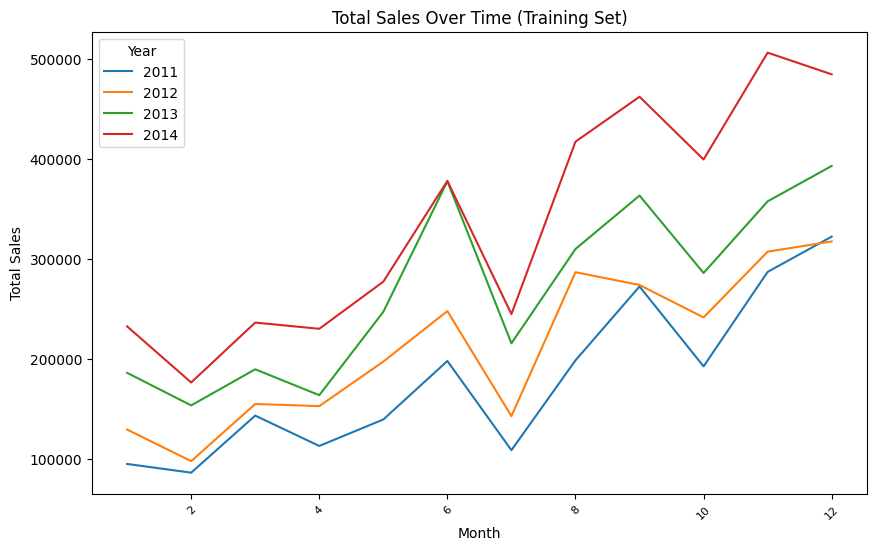

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql.functions import sum

# Group by Year and Month to calculate the sum of Sales for the training set
monthly_summary_training = training.groupBy('Year', 'Month').agg(
    sum('Sales').alias('Total_Sales')
)

# Convert the grouped DataFrame to Pandas DataFrame
monthly_summary_training_pd = monthly_summary_training.orderBy('Year', 'Month').toPandas()

# Create a 'Year-Month' column for plotting
monthly_summary_training_pd['Year-Month'] = monthly_summary_training_pd['Year'].astype(str) + '-' + monthly_summary_training_pd['Month'].astype(str)

# Plot Sales over time with different colors for different years
plt.figure(figsize=(10, 6))
sns.lineplot(data=monthly_summary_training_pd, x='Month', y='Total_Sales', hue='Year', palette='tab10')
plt.title('Total Sales Over Time (Training Set)')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.xticks(rotation=45, fontsize=8)
plt.legend(title='Year')
plt.show()

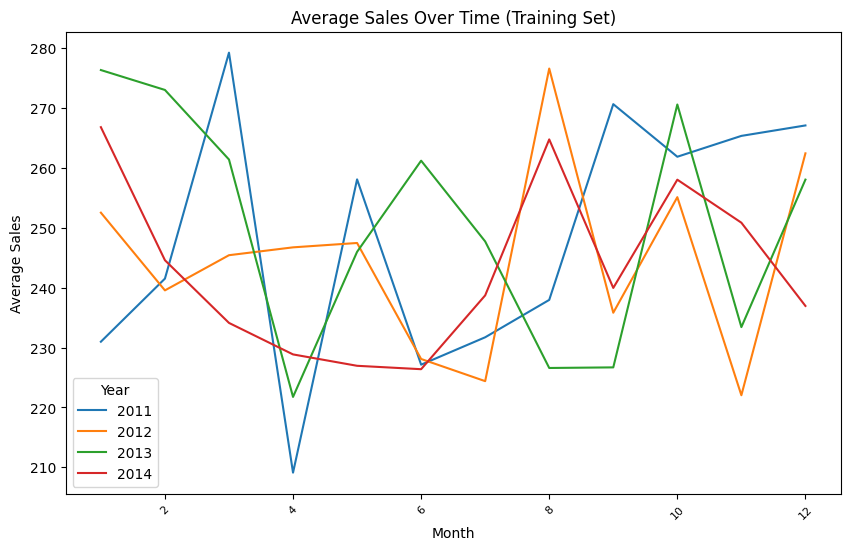

In [0]:
from pyspark.sql.functions import avg

# Group by Year and Month to calculate the average Sales for the training set
monthly_summary_training = training.groupBy('Year', 'Month').agg(
    avg('Sales').alias('Average_Sales')
)

# Convert the grouped DataFrame to Pandas DataFrame
monthly_summary_training_pd = monthly_summary_training.orderBy('Year', 'Month').toPandas()

# Create a 'Year-Month' column for plotting
monthly_summary_training_pd['Year-Month'] = monthly_summary_training_pd['Year'].astype(str) + '-' + monthly_summary_training_pd['Month'].astype(str)

# Plot Average Sales over time with different colors for different years
plt.figure(figsize=(10, 6))
sns.lineplot(data=monthly_summary_training_pd, x='Month', y='Average_Sales', hue='Year', palette='tab10')
plt.title('Average Sales Over Time (Training Set)')
plt.xlabel('Month')
plt.ylabel('Average Sales')
plt.xticks(rotation=45, fontsize=8)
plt.legend(title='Year')
plt.show()

# Feature Engineering (Training set only)

In [0]:
from pyspark.sql.functions import avg

# Group by year and month to create a time series with average sales
df_monthly = training.groupBy('Year', 'Month').agg(avg('Sales').alias('Average_Sales'))

# Sort the DataFrame in ascending order by year and month
df_monthly = df_monthly.orderBy('Year', 'Month')

# Display the DataFrame after grouping by month
display(df_monthly)

Year,Month,Average_Sales
2011,1,230.97967605839415
2011,2,241.51787669467785
2011,3,279.257287251462
2011,4,209.10857233333334
2011,5,258.0917827037037
2011,6,227.14450491389206
2011,7,231.72045761194028
2011,8,237.96321896882492
2011,9,270.6569906361828
2011,10,261.87341229931974


<Axes: xlabel='Lag', ylabel='Autocorrelation'>

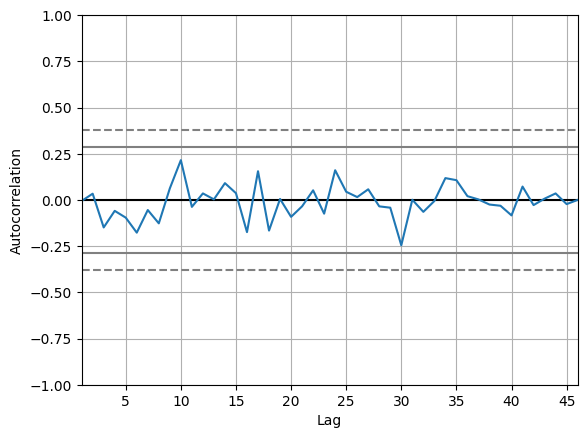

In [0]:
import pandas as pd
from pandas.plotting import autocorrelation_plot

# Convert Spark DataFrame to Pandas DataFrame
df_monthly_pd = df_monthly.toPandas()

# Plot the autocorrelation of the 'Average Sales' column
autocorrelation_plot(df_monthly_pd['Average_Sales'])

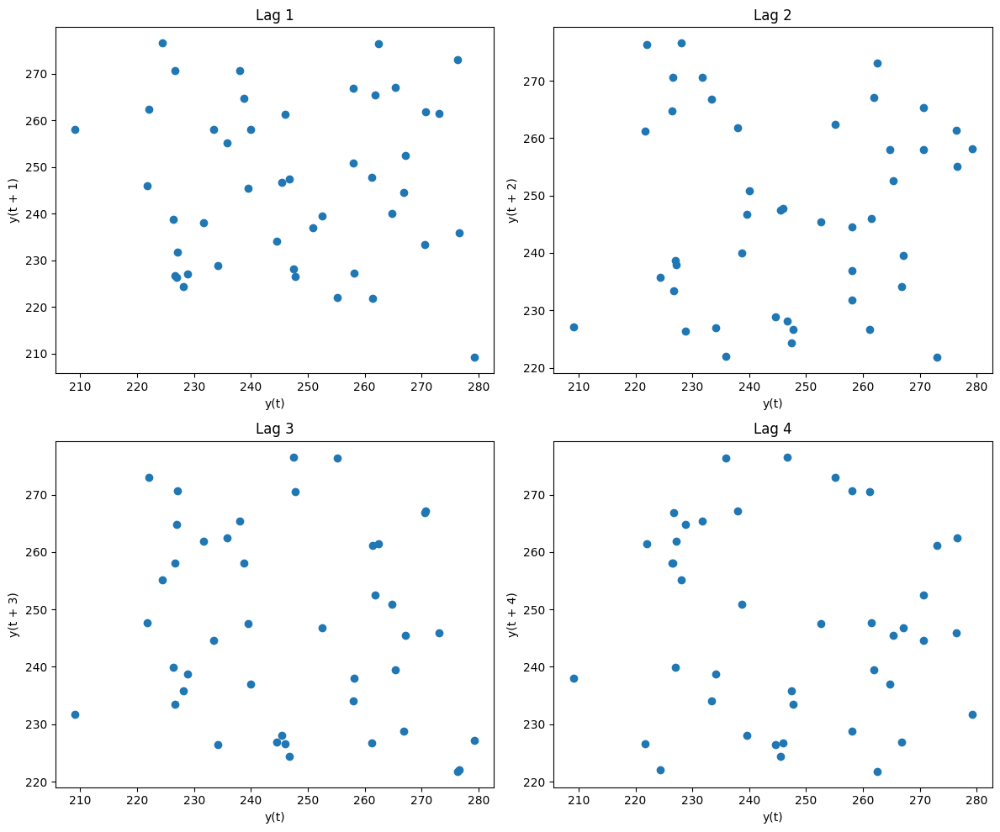

In [0]:
from pandas.plotting import lag_plot
import matplotlib.pyplot as plt

def plot_lag_plots(data, column, lags, figsize=(12, 10)):
    # Create a subplot grid based on the number of lags
    nrows = (len(lags) + 1) // 2
    fig, axes = plt.subplots(nrows, 2, figsize=figsize)
    
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    
    # Plot each lag
    for i, lag in enumerate(lags):
        lag_plot(data[column], lag=lag, ax=axes[i])
        axes[i].set_title(f'Lag {lag}')
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage
plot_lag_plots(df_monthly_pd, 'Average_Sales', lags=[1,2,3,4])

In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import lag

# Define a window specification
window_spec = Window.orderBy('Year', 'Month')

# Create lag features (previous month's sales)
df_monthly = df_monthly.withColumn('Lag_1', lag('Average_Sales', 1).over(window_spec))
df_monthly = df_monthly.withColumn('Lag_2', lag('Average_Sales', 2).over(window_spec))

# Display the DataFrame after adding lag features
display(df_monthly)


Year,Month,Average_Sales,Lag_1,Lag_2
2011,1,230.97967605839415,null,null
2011,2,241.51787669467785,230.97967605839415,null
2011,3,279.257287251462,241.51787669467785,230.97967605839415
2011,4,209.10857233333334,279.257287251462,241.51787669467785
2011,5,258.0917827037037,209.10857233333334,279.257287251462
2011,6,227.14450491389206,258.0917827037037,209.10857233333334
2011,7,231.72045761194028,227.14450491389206,258.0917827037037
2011,8,237.96321896882492,231.72045761194028,227.14450491389206
2011,9,270.6569906361828,237.96321896882492,231.72045761194028
2011,10,261.87341229931974,270.6569906361828,237.96321896882492


In [0]:
# Drop missing values created by lagging
df_monthly = df_monthly.dropna()

# Display the DataFrame after removing null values
display(df_monthly)

Year,Month,Average_Sales,Lag_1,Lag_2
2011,3,279.257287251462,241.51787669467785,230.97967605839415
2011,4,209.10857233333334,279.257287251462,241.51787669467785
2011,5,258.0917827037037,209.10857233333334,279.257287251462
2011,6,227.14450491389206,258.0917827037037,209.10857233333334
2011,7,231.72045761194028,227.14450491389206,258.0917827037037
2011,8,237.96321896882492,231.72045761194028,227.14450491389206
2011,9,270.6569906361828,237.96321896882492,231.72045761194028
2011,10,261.87341229931974,270.6569906361828,237.96321896882492
2011,11,265.3569929879741,261.87341229931974,270.6569906361828
2011,12,267.10185366500826,265.3569929879741,261.87341229931974


# Modelling (Training set only)

In [0]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Convert Spark DataFrame to Pandas DataFrame
df_monthly_pd = df_monthly.toPandas()

# Define features and target
X = df_monthly_pd[['Lag_1', 'Lag_2']]
y = df_monthly_pd['Average_Sales']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

In [0]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Define the model
rf = RandomForestRegressor(random_state=42)

# Define the parameters grid
param_grid = {
    'n_estimators': [100, 300, 500],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [1.0, 'sqrt', 'log2']  
}

# Grid Search
grid_search = GridSearchCV(
    estimator=rf, 
    param_grid=param_grid, 
    cv=5, 
    scoring='neg_mean_squared_error', 
    n_jobs=-1, 
    verbose=2
)

# Fit the model
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score:", best_score)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV] END max_depth=10, max_features=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.4s
[CV] END max_depth=10, max_features=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.7s
[CV] END max_depth=10, max_features=1.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=1.0, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, max_features=1.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; total time=   0.4s
[CV] END max_depth=10, max_features=1.0, min_samples_leaf=1, min_samples_split=5, n_estimators=300; tot

In [0]:
import mlflow
import mlflow.pyfunc
import mlflow.sklearn
import numpy as np
import sklearn
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import cross_val_score, KFold
from mlflow.models.signature import infer_signature
from mlflow.utils.environment import _mlflow_conda_env
import cloudpickle

# The predict method of sklearn's RandomForestRegressor returns the predicted values.
# The following code creates a wrapper function, SklearnModelWrapper, that uses the predict method to return the predicted values.

class SklearnModelWrapper(mlflow.pyfunc.PythonModel):
    def __init__(self, model):
        self.model = model
    
    def predict(self, context, model_input):
        return self.model.predict(model_input)

# mlflow.start_run creates a new MLflow run to track the performance of this model.
# Within the context, you call mlflow.log_param to keep track of the parameters used, and mlflow.log_metric to record metrics like RMSE, MAE, R-squared, MAPE and Mean Cross-Validation MSE.

# End the current run if there is one
if mlflow.active_run():
    mlflow.end_run()

with mlflow.start_run(run_name='random_forest_forecasting'): # assigns a name to the run
    model = RandomForestRegressor(**best_params, random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Evaluate the model
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)

    # Perform cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X_train, y_train, cv=kf, scoring='neg_mean_squared_error')
    mean_cv_mse = -cv_scores.mean()

    # Log parameters and metrics
    mlflow.log_params(best_params)
    mlflow.log_metric('rmse', rmse)
    mlflow.log_metric('mae', mae)
    mlflow.log_metric('r2', r2)
    mlflow.log_metric('mean_cv_mse', mean_cv_mse)
    mlflow.log_metric('mape', mape)

    wrappedModel = SklearnModelWrapper(model)

    # Log the model with a signature that defines the schema of the model's inputs and outputs.
    # When the model is deployed, this signature will be used to validate inputs.
    signature = infer_signature(X_train, wrappedModel.predict(None, X_train))
    
    # MLflow contains utilities to create a conda environment used to serve models.
    # The necessary dependencies are added to a conda.yaml file which is logged along with the model.
    conda_env = _mlflow_conda_env(
        additional_conda_deps=None,
        additional_pip_deps=[
            "cloudpickle=={}".format(cloudpickle.__version__), 
            "scikit-learn=={}".format(sklearn.__version__)
        ],
        additional_conda_channels=None,
    )
    mlflow.pyfunc.log_model("random_forest_model", python_model=wrappedModel, conda_env=conda_env, signature=signature)

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

# Model Evaluation (Training set only)

In [0]:
# Evaluate the model
print(f'RMSE: {rmse}')

# Calculate Mean Absolute Error (MAE)
print(f"Mean Absolute Error (MAE): {mae}")

# Calculate R-squared
print(f"R-squared: {r2}")

# Calculate MAPE
print(f"MAPE: {mape}")

# Perform cross-validation
print(f"Cross-validation MAE scores: {-cv_scores}")
print(f"Mean cross-validation MAE: {-cv_scores.mean()}")

RMSE: 18.406539339764727
Mean Absolute Error (MAE): 15.23723403125409
R-squared: -1.146062560508613
MAPE: 0.06490659892435668
Cross-validation MAE scores: [158.70134892 460.54660561 384.15971386 360.48321615 500.90874148]
Mean cross-validation MAE: 372.95992520480445


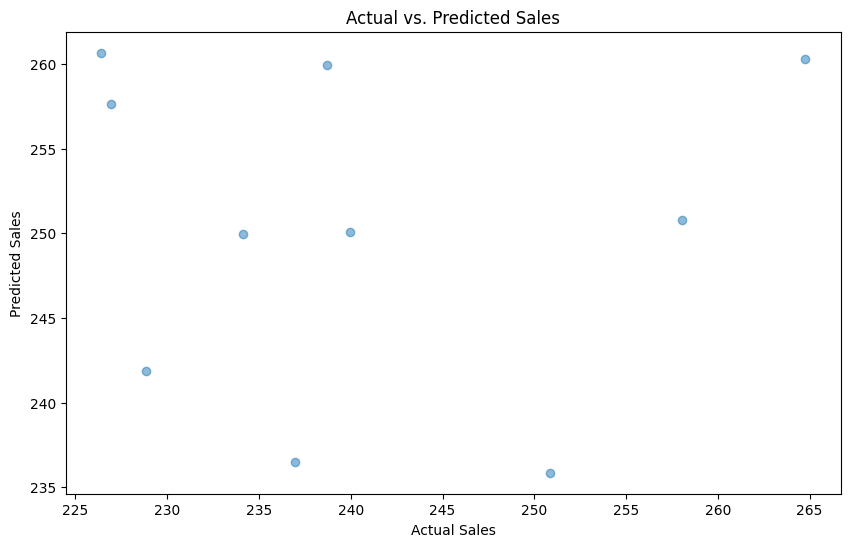

In [0]:
# Plot the actual and predicted sales
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel('Actual Sales')
plt.ylabel('Predicted Sales')
plt.title('Actual vs. Predicted Sales')
plt.show()

In [0]:
# Use the last available month as input for the next month's forecast
last_month = df_monthly_pd.iloc[-1]
next_month_pred = model.predict(pd.DataFrame([{
    'Lag_1': last_month['Lag_1'],
    'Lag_2': last_month['Lag_2']
}]))

predictions = []

for i in range(12):
    next_month_prediction = model.predict(pd.DataFrame([{
        'Lag_1': last_month['Lag_1'],
        'Lag_2': last_month['Lag_2']
    }]))[0]
    predictions.append(next_month_prediction)
    
    # Update last_month to include the new prediction as a lag feature
    last_month = pd.Series({
        'Lag_1': next_month_prediction,
        'Lag_2': last_month['Lag_1']
    })

# Convert predictions into a DataFrame
predicted_sales = pd.DataFrame({
    'Month': pd.date_range(start='2015-01-01', periods=12, freq='M'),
    'Predicted_Sales': predictions
})

# Display the predicted sales DataFrame
display(predicted_sales)

Month,Predicted_Sales
2015-01-31T00:00:00Z,236.47832209321453
2015-02-28T00:00:00Z,242.7545636769204
2015-03-31T00:00:00Z,250.7737517988515
2015-04-30T00:00:00Z,234.46770691034794
2015-05-31T00:00:00Z,242.7545636769204
2015-06-30T00:00:00Z,259.4958726043482
2015-07-31T00:00:00Z,235.38195845131682
2015-08-31T00:00:00Z,244.57206535449012
2015-09-30T00:00:00Z,251.3779863869655
2015-10-31T00:00:00Z,233.67946875464284


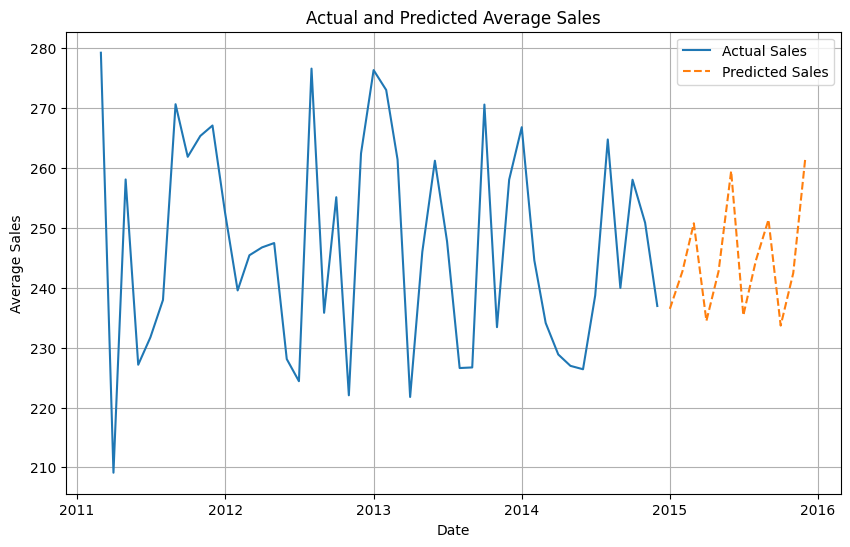

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Convert 'Month' column to datetime
predicted_sales['Month'] = pd.date_range(start='2015-01-01', periods=12, freq='M')

# Extract actual sales data before 2015
actual_sales_before_2015 = df_monthly_pd[df_monthly_pd['Year'] < 2015]

# Combine actual sales data with predicted sales data
predicted_sales['Year'] = predicted_sales['Month'].dt.year
predicted_sales['Month'] = predicted_sales['Month'].dt.month
combined_sales = pd.concat([
    actual_sales_before_2015[['Year', 'Month', 'Average_Sales']],
    predicted_sales.rename(columns={'Predicted_Sales': 'Average_Sales'})
])

# Filter out non-finite values from the 'Year' column
combined_sales = combined_sales[np.isfinite(combined_sales['Year'])]

# Convert 'Year' and 'Month' columns to integers
combined_sales['Year'] = combined_sales['Year'].astype(int)
combined_sales['Month'] = combined_sales['Month'].astype(int)

# Create a 'Date' column for plotting
combined_sales['Date'] = pd.to_datetime(combined_sales[['Year', 'Month']].assign(day=1))

# Plot the combined sales data
plt.figure(figsize=(10, 6))
plt.plot(combined_sales[combined_sales['Year'] < 2015]['Date'], combined_sales[combined_sales['Year'] < 2015]['Average_Sales'], label='Actual Sales', linestyle='-')
plt.plot(combined_sales[combined_sales['Year'] == 2015]['Date'], combined_sales[combined_sales['Year'] == 2015]['Average_Sales'], label='Predicted Sales', linestyle='--')
plt.title('Actual and Predicted Average Sales')
plt.xlabel('Date')
plt.ylabel('Average Sales')
plt.legend()
plt.grid(True)
plt.show()

# Model Deployment

### Register ML model 

The trained Random Forest model is logged to MLflow’s tracking server, capturing its state and associated artifacts. The logged model is registered in MLflow’s Model Registry under the name "RandomForestModel", allowing you to track and manage different versions of this model.

In [0]:
import mlflow
import mlflow.sklearn

# Log the model
mlflow.sklearn.log_model(model, "random-forest-model")

# Get the run ID of the current active run
run_id = mlflow.active_run().info.run_id

# Register the model
model_uri = f"runs:/{run_id}/random-forest-model"
mlflow.register_model(model_uri, "RandomForestModel")

2024/08/22 13:37:08 WARNING mlflow.models.model: Model logged without a signature. Signatures will be required for upcoming model registry features as they validate model inputs and denote the expected schema of model outputs. Please visit https://www.mlflow.org/docs/2.13.1/models.html#set-signature-on-logged-model for instructions on setting a model signature on your logged model.


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Registered model 'RandomForestModel' already exists. Creating a new version of this model...
2024/08/22 13:37:10 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: RandomForestModel, version 7
Created version '7' of model 'RandomForestModel'.


<ModelVersion: aliases=[], creation_timestamp=1724333830195, current_stage='None', description='', last_updated_timestamp=1724333830195, name='RandomForestModel', run_id='cb4ba0e34c46440697d66299f4706752', run_link='', source='dbfs:/databricks/mlflow-tracking/4204990937189233/cb4ba0e34c46440697d66299f4706752/artifacts/random-forest-model', status='PENDING_REGISTRATION', status_message='', tags={}, user_id='5840495230112025', version='7'>

### Setting the model stage as Staging

If you're still testing or validating the model, you might want to set it to "Staging"

When the model is ready for deployment and use in a live environment, transition it to "Production"

In [0]:
from mlflow.tracking import MlflowClient

# Initialize the MLflow Client
client = MlflowClient()

# Get the latest version of the registered model
model_name = "RandomForestModel"
latest_version_info = client.get_latest_versions(model_name, stages=["None"])[0]

# Transition the registered model version to the "Staging" stage
client.transition_model_version_stage(
    name=model_name,  # The name of the registered model
    version=latest_version_info.version,  # The version number of the model
    stage="Staging"  # The stage to transition to ("Staging", "Production", or "Archived")
)

print(f"Model version {latest_version_info.version} set to 'Staging' stage.")

/root/.ipykernel/1288/command-4104159755987645-3154651740:8: FutureWarning: ``mlflow.tracking.client.MlflowClient.get_latest_versions`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/2.13.1/model-registry.html#migrating-from-stages
  latest_version_info = client.get_latest_versions(model_name, stages=["None"])[0]
/root/.ipykernel/1288/command-4104159755987645-3154651740:11: FutureWarning: ``mlflow.tracking.client.MlflowClient.transition_model_version_stage`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/2.13.1/model-registry.html#migrating-from-stages
  client.transition_model_version_stage(


Model version 7 set to 'Staging' stage.


# Experiment with a new model

The random forest model performed well even without hyperparameter tuning.

Use the xgboost library to train a more accurate model. Run a hyperparameter sweep to train multiple models in parallel, using Hyperopt and SparkTrials. As before, MLflow tracks the performance of each parameter configuration.

In [0]:
from hyperopt import fmin, tpe, hp, SparkTrials, STATUS_OK
from hyperopt.pyll import scope
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import mlflow
import mlflow.xgboost
import numpy as np
import xgboost as xgb
import pandas as pd
from mlflow.models.signature import infer_signature

# Convert Spark DataFrame to Pandas DataFrame
df_monthly_pd = df_monthly.toPandas()

# Define features and target
X = df_monthly_pd[['Lag_1', 'Lag_2']]
y = df_monthly_pd['Average_Sales']

# Encode target variable if it's categorical
if y.dtype == 'object':
    le = LabelEncoder()
    y = le.fit_transform(y)

# Split the data
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=False
)

# Define the search space for hyperparameters
search_space = {
    'max_depth': scope.int(hp.quniform('max_depth', 4, 100, 1)),
    'learning_rate': hp.loguniform('learning_rate', -3, 0),
    'reg_alpha': hp.loguniform('reg_alpha', -5, -1),
    'reg_lambda': hp.loguniform('reg_lambda', -6, -1),
    'min_child_weight': hp.loguniform('min_child_weight', -1, 3),
    'objective': 'reg:squarederror',  # Use regression objective for continuous target
    'seed': 123,  # Set a seed for deterministic training
}

# End the current run if there is one
if mlflow.active_run():
    mlflow.end_run()

def train_model(params):
    # With MLflow autologging, hyperparameters and the trained model are automatically logged to MLflow.
    mlflow.xgboost.autolog()
    with mlflow.start_run(nested=True):
        train = xgb.DMatrix(data=X_train, label=y_train)
        validation = xgb.DMatrix(data=X_val, label=y_val)
        # Pass in the validation set so xgb can track an evaluation metric. XGBoost terminates training when the evaluation metric is no longer improving.
        booster = xgb.train(
            params=params, 
            dtrain=train, 
            num_boost_round=1000,
            evals=[(validation, "validation")], 
            early_stopping_rounds=50
        )
        validation_predictions = booster.predict(validation)
        mape_score = mean_absolute_percentage_error(y_val, validation_predictions)
        mlflow.log_metric('mape', mape_score)

        signature = infer_signature(X_train, booster.predict(train))
        mlflow.xgboost.log_model(booster, "model", signature=signature)
        
        # Set the loss to mape_score so fmin minimizes the MAPE
        return {'status': STATUS_OK, 'loss': mape_score, 'booster': booster.attributes()}

# Greater parallelism will lead to speedups, but a less optimal hyperparameter sweep. 
# A reasonable value for parallelism is the square root of max_evals.
spark_trials = SparkTrials(parallelism=10)

# Run fmin within an MLflow run context so that each hyperparameter configuration is logged as a child run of a parent run called "xgboost_models".
with mlflow.start_run(run_name='xgboost_models'):
    best_params = fmin(
        fn=train_model, 
        space=search_space, 
        algo=tpe.suggest, 
        max_evals=96,
        trials=spark_trials,
    )

INFO:hyperopt-spark:Hyperopt with SparkTrials will automatically track trials in MLflow. To view the MLflow experiment associated with the notebook, click the 'Runs' icon in the notebook context bar on the upper right. There, you can view all runs.
INFO:hyperopt-spark:To view logs from trials, please check the Spark executor logs. To view executor logs, expand 'Spark Jobs' above until you see the (i) icon next to the stage from the trial job. Click it and find the list of tasks. Click the 'stderr' link for a task to view trial logs.


100%|██████████| 96/96 [06:10<00:00,  3.86s/trial, best loss: 0.057944726094620355]


INFO:hyperopt-spark:Total Trials: 96: 96 succeeded, 0 failed, 0 cancelled.


### Use MLflow to view the results

Notice that the MAPE value of XgBoost model is lower than Random Forest model

In [0]:
import mlflow

# Search for the best run based on the MAPE metric
best_run = mlflow.search_runs(order_by=['metrics.mape ASC']).iloc[0]

# Print the MAPE of the best run
print(f'MAPE of Best Run: {best_run["metrics.mape"]}')

MAPE of Best Run: 0.057944726094620355


### Update the production model in MLflow Model Registry

Click Models in the left sidebar to see that the model now has two versions.

Promote the new version to production.

In [0]:
import time

new_model_version = mlflow.register_model(f"runs:/{best_run.run_id}/model", model_name)

# Registering the model takes a few seconds, so add a small delay
time.sleep(15)

Registered model 'RandomForestModel' already exists. Creating a new version of this model...
2024/08/22 14:07:15 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: RandomForestModel, version 9
Created version '9' of model 'RandomForestModel'.


In [0]:
# Archive the old model version
client.transition_model_version_stage(
  name=model_name,
  version=latest_version_info.version,
  stage="Archived"
)

# Promote the new model version to Production
client.transition_model_version_stage(
  name=model_name,
  version=new_model_version.version,
  stage="Production"
)

/root/.ipykernel/1288/command-2907545596290036-3538229353:2: FutureWarning: ``mlflow.tracking.client.MlflowClient.transition_model_version_stage`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/2.13.1/model-registry.html#migrating-from-stages
  client.transition_model_version_stage(
/root/.ipykernel/1288/command-2907545596290036-3538229353:9: FutureWarning: ``mlflow.tracking.client.MlflowClient.transition_model_version_stage`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/2.13.1/model-registry.html#migrating-from-stages
  client.transition_model_version_stage(


<ModelVersion: aliases=[], creation_timestamp=1724335635146, current_stage='Production', description='', last_updated_timestamp=1724335765666, name='RandomForestModel', run_id='0f1fc8ed7f9c40408f203906ffa76428', run_link='', source='dbfs:/databricks/mlflow-tracking/4204990937189233/0f1fc8ed7f9c40408f203906ffa76428/artifacts/model', status='READY', status_message='', tags={}, user_id='5840495230112025', version='9'>

### Clients that call load_model now receive the new model

In [0]:
import mlflow.xgboost
from sklearn.metrics import mean_absolute_percentage_error

# Load the best XGBoost model from the MLflow Model Registry
model = mlflow.xgboost.load_model(f"models:/{model_name}/production")

# Make predictions on the test set
y_pred = model.predict(xgb.DMatrix(X_test))

# Calculate and print the MAPE
mape = mean_absolute_percentage_error(y_test, y_pred)
print(f'MAPE: {mape}')

/databricks/python/lib/python3.11/site-packages/mlflow/store/artifact/utils/models.py:32: FutureWarning: ``mlflow.tracking.client.MlflowClient.get_latest_versions`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/2.13.1/model-registry.html#migrating-from-stages
  latest = client.get_latest_versions(name, None if stage is None else [stage])


MAPE: 0.057944726094620355


# Define input and output for batch inference

There are many scenarios where you might want to evaluate a model on a corpus of new data. For example, you may have a fresh batch of data, or may need to compare the performance of two models on the same corpus of data.

The table path assigned to input_table_name will be used for batch inference and the predictions will be saved to output_table_path.

In [0]:
# redefining key variables here because %pip and %conda restarts the Python interpreter
input_table_name = "default.salesDF_holdout" # Test the best Random Forest model with holdout set
output_table_path = "/FileStore/batch-inference/salesDF_output"

In [0]:
# load table as a Spark DataFrame
table = spark.table(input_table_name)

### Load model and run inference

If the new model achieves the success criteria, register it into the MLFlow

A MAPE under 10% shows high accuracy, 10-20% shows good forecast results, 20-50% shows reasonable forecast results, and greater than 50% shows incorrect results

In [0]:
from pyspark.sql.functions import avg

# Group by year and month to create a time series with average sales
df_monthly = holdout.groupBy('Year', 'Month').agg(avg('Sales').alias('Average_Sales'))

# Sort the DataFrame in ascending order by year and month
df_monthly = df_monthly.orderBy('Year', 'Month')

# Display the DataFrame after grouping by month
display(df_monthly)

Year,Month,Average_Sales
2011,1,180.26554545454545
2011,2,234.77500000000003
2011,3,95.01457692307692
2011,4,166.54729666666665
2011,5,283.77974769230764
2011,6,377.48948782608693
2011,7,262.8278653846154
2011,8,207.2765136363636
2011,9,389.8591904347826
2011,10,169.08476923076924


In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import lag

# Define a window specification
window_spec = Window.orderBy('Year', 'Month')

# Create lag features (previous month's sales)
df_monthly = df_monthly.withColumn('Lag_1', lag('Average_Sales', 1).over(window_spec))
df_monthly = df_monthly.withColumn('Lag_2', lag('Average_Sales', 2).over(window_spec))

# Display the DataFrame after adding lag features
display(df_monthly)

Year,Month,Average_Sales,Lag_1,Lag_2
2011,1,180.26554545454545,null,null
2011,2,234.77500000000003,180.26554545454545,null
2011,3,95.01457692307692,234.77500000000003,180.26554545454545
2011,4,166.54729666666665,95.01457692307692,234.77500000000003
2011,5,283.77974769230764,166.54729666666665,95.01457692307692
2011,6,377.48948782608693,283.77974769230764,166.54729666666665
2011,7,262.8278653846154,377.48948782608693,283.77974769230764
2011,8,207.2765136363636,262.8278653846154,377.48948782608693
2011,9,389.8591904347826,207.2765136363636,262.8278653846154
2011,10,169.08476923076924,389.8591904347826,207.2765136363636


In [0]:
# Drop missing values created by lagging
df_monthly = df_monthly.dropna()

# Display the DataFrame after removing null values
display(df_monthly)

Year,Month,Average_Sales,Lag_1,Lag_2
2011,3,95.01457692307692,234.77500000000003,180.26554545454545
2011,4,166.54729666666665,95.01457692307692,234.77500000000003
2011,5,283.77974769230764,166.54729666666665,95.01457692307692
2011,6,377.48948782608693,283.77974769230764,166.54729666666665
2011,7,262.8278653846154,377.48948782608693,283.77974769230764
2011,8,207.2765136363636,262.8278653846154,377.48948782608693
2011,9,389.8591904347826,207.2765136363636,262.8278653846154
2011,10,169.08476923076924,389.8591904347826,207.2765136363636
2011,11,200.78669137931035,169.08476923076924,389.8591904347826
2011,12,207.03331719298248,200.78669137931035,169.08476923076924


In [0]:
import mlflow
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, mean_absolute_error
import pandas as pd

# Define a success threshold for MAPE (e.g., MAPE < 10%)
success_threshold = 0.10

# Convert Spark DataFrame to Pandas DataFrame
df_monthly_pd = df_monthly.toPandas()

# Define features and target
X = df_monthly_pd[['Lag_1', 'Lag_2']]
y = df_monthly_pd['Average_Sales']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

# End the current MLflow run if there is one
if mlflow.active_run():
    mlflow.end_run()

with mlflow.start_run(experiment_id="4204990937189233", run_name="RandomForest") as mlflow_run:
    mlflow.set_tag("estimator_name", "RandomForest")
    
    # Train the Random Forest model
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = rf_model.predict(X_test)
    
    # Calculate metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    
    # Log the metrics to mlflow
    mlflow.log_metric("mean_squared_error", mse)
    mlflow.log_metric("root_mean_squared_error", rmse)
    mlflow.log_metric("mean_absolute_error", mae)
    mlflow.log_metric("mean_absolute_percentage_error", mape)
    
    # Check if the model meets the success criteria
    if mape < success_threshold:
        print(f"Model meets the success criteria with MAPE: {mape}. Registering the model...")
        
        # Log the Random Forest model
        mlflow.sklearn.log_model(rf_model, "random-forest-model")
        
        # Register the model
        registered_model_version = mlflow.register_model(f"runs:/{mlflow_run.info.run_id}/random-forest-model", "RandomForestModel")
    else:
        print(f"Model did not meet the success threshold. MAPE: {mape}. Registration skipped.")

Model did not meet the success threshold. MAPE: 0.3000004982295548. Registration skipped.


### Update the production model in MLflow Model Registry
If the model meets the success criteria, archived the existing model and update the new model to production stage

In [0]:
if mape < success_threshold:
    try:
        client.transition_model_version_stage(
            name="RandomForestModel",
            version=int(registered_model_version.version) - 1,
            stage="Archived"
        )
    except Exception as e:
        print(f"Error archiving previous model versions: {e}")
    
    try:
        client.transition_model_version_stage(
            name="RandomForestModel",
            version=registered_model_version.version,
            stage="Production",
            archive_existing_versions=True
        )
    except Exception as e:
        print(f"Error transitioning model to Production: {e}")

# Schedule MLOps Pipeline And Make Real-Time Predictions

To make this an automated, repeatable process that will build and deploy a new model on fresh data in case the catalog updates the source dataset and the new model surpasses the set threshold of 90 percent correct predictions on the new holdout dataset, all that needs to be done is to schedule a Databricks Workflow which can be achieved on the notebook page view by clicking on ‘Schedule’